# **Autres transformations pour le décoding**
_Alexandre Lainé ~ 14/10/2023_

In [1]:
# Importation des modules d'intérêt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
import scipy.special as ss
from tqdm import tqdm
import params as prm
import numpy as np
import os

In [2]:
# Charte graphique des graphs
colors = ["black", "red", "brown", "purple", "green", "blue"]
colors_fill = ["grey", "tomato", "chocolate", "violet", "lightgreen", "lightblue"]

## Décodage de l'orientation ($\theta$)

In [3]:
# Chargement des données pour le décodage de l'identité du stimulus
path = os.getcwd()
data = np.load(os.path.join(path, "data", "Stage", "decod_theta", "raw_data", "Data.npy"))
label = np.load(os.path.join(path, "data", "Stage", "decod_theta", "raw_data", "Labels.npy"))
data_eq = np.load(os.path.join(path, "data", "Stage", "decod_theta", "raw_data", "Data_eq.npy"))

# Vérification de l'importation
print(f"Data information : shape = {np.shape(data)}, mean = {np.mean(data)}, sd = {np.std(data)}")
print(f"Data_eq information : shape = {np.shape(data_eq)}, mean = {np.mean(data_eq)}, sd = {np.std(data_eq)}")

Data information : shape = (8, 61, 360, 249), mean = 0.8718462648407839, sd = 2.051178148209903
Data_eq information : shape = (8, 61, 360, 249), mean = 0.8373228067738485, sd = 0.05118460822868948


In [4]:
# Autres transformations
data_gamma = ss.gamma(data_eq) 
data_probit = ss.erfinv(2*data_eq-1)
data_logit = ss.logit(data_eq)
data_expit = ss.expit(data_eq)

# Vérification des transformations
print(f"Data_gamma information : shape = {np.shape(data_gamma)}, mean = {np.mean(data_gamma)}, sd = {np.std(data_gamma)}")
print(f"Data_probit information : shape = {np.shape(data_probit)}, mean = {np.mean(data_probit)}, sd = {np.std(data_probit)}")
print(f"Data_logit information : shape = {np.shape(data_logit)}, mean = {np.mean(data_logit)}, sd = {np.std(data_logit)}")
print(f"Data_expit information : shape = {np.shape(data_expit)}, mean = {np.mean(data_expit)}, sd = {np.std(data_expit)}")

Data_gamma information : shape = (8, 61, 360, 249), mean = 1.128818129684654, sd = 0.046004753838661046
Data_probit information : shape = (8, 61, 360, 249), mean = 0.72095595367282, sd = 0.19598640423920616
Data_logit information : shape = (8, 61, 360, 249), mean = 1.723227140790674, sd = 0.5441750792360579
Data_expit information : shape = (8, 61, 360, 249), mean = 0.6977902372936091, sd = 0.010643984808122037


In [5]:
# Fonction réalisant le décoding en utilisant un modèle de régression logistique
def decodeur_theta(DATA=[], LABELS=[]):
    Scores_mean = np.zeros((61, len(prm.B_thetas)))
    Scores_sd = np.zeros((61, len(prm.B_thetas)))
    for j in range(len(prm.B_thetas)):
        print("btheta = "+str(round(prm.B_thetas[j],2)))
        data = DATA[j,:,:,:]
        labels = LABELS[j,:]
        scores = np.zeros((len(prm.timesteps),prm.n_splits))
        logreg = LogisticRegression(**prm.opts_LR)
        for i in tqdm(range(data.shape[0]), desc = 'Decoding'):
            scores[i,:] = cross_val_score(logreg, data[i,:,:], labels, cv = prm.n_splits,
                                          scoring = 'balanced_accuracy')
        Scores_mean[:,j] = scores.mean(axis=-1)
        Scores_sd[:,j] = scores.std(axis=-1)
    return Scores_mean, Scores_sd

In [6]:
# Décodage de l'orientation selon différente valeur de variabilité et pour l'ensemble des données
DATA_type = ["raw", "egal", "gamma", "probit", "logit", "expit"]
Mean = np.zeros((len(prm.timesteps), len(prm.B_thetas), len(DATA_type)))
Sd = np.zeros((len(prm.timesteps), len(prm.B_thetas), len(DATA_type)))
for i, x in enumerate([data, data_eq, data_gamma, data_probit, data_logit, data_expit]):
    print(f"Data type : {DATA_type[i]}")
    Score_mean, Score_sd = decodeur_theta(DATA=x, LABELS=label)
    Mean[:,:,i] = Score_mean
    Sd[:,:,i] = Score_sd

Data type : raw
btheta = 0.63


Decoding:   0%|          | 0/61 [00:00<?, ?it/s]

Decoding: 100%|██████████| 61/61 [00:40<00:00,  1.50it/s]


btheta = 0.54


Decoding: 100%|██████████| 61/61 [00:35<00:00,  1.72it/s]


btheta = 0.45


Decoding: 100%|██████████| 61/61 [00:37<00:00,  1.65it/s]


btheta = 0.36


Decoding: 100%|██████████| 61/61 [00:34<00:00,  1.75it/s]


btheta = 0.27


Decoding: 100%|██████████| 61/61 [00:38<00:00,  1.60it/s]


btheta = 0.18


Decoding: 100%|██████████| 61/61 [00:41<00:00,  1.45it/s]


btheta = 0.09


Decoding: 100%|██████████| 61/61 [00:38<00:00,  1.57it/s]


btheta = 0.0


Decoding: 100%|██████████| 61/61 [00:38<00:00,  1.57it/s]


Data type : egal
btheta = 0.63


Decoding: 100%|██████████| 61/61 [00:14<00:00,  4.19it/s]


btheta = 0.54


Decoding: 100%|██████████| 61/61 [00:15<00:00,  3.94it/s]


btheta = 0.45


Decoding: 100%|██████████| 61/61 [00:15<00:00,  3.89it/s]


btheta = 0.36


Decoding: 100%|██████████| 61/61 [00:16<00:00,  3.79it/s]


btheta = 0.27


Decoding: 100%|██████████| 61/61 [00:16<00:00,  3.72it/s]


btheta = 0.18


Decoding: 100%|██████████| 61/61 [00:16<00:00,  3.60it/s]


btheta = 0.09


Decoding: 100%|██████████| 61/61 [00:17<00:00,  3.46it/s]


btheta = 0.0


Decoding: 100%|██████████| 61/61 [00:19<00:00,  3.17it/s]


Data type : gamma
btheta = 0.63


Decoding: 100%|██████████| 61/61 [00:12<00:00,  4.92it/s]


btheta = 0.54


Decoding: 100%|██████████| 61/61 [00:13<00:00,  4.37it/s]


btheta = 0.45


Decoding: 100%|██████████| 61/61 [00:14<00:00,  4.26it/s]


btheta = 0.36


Decoding: 100%|██████████| 61/61 [00:15<00:00,  4.03it/s]


btheta = 0.27


Decoding: 100%|██████████| 61/61 [00:16<00:00,  3.70it/s]


btheta = 0.18


Decoding: 100%|██████████| 61/61 [00:16<00:00,  3.66it/s]


btheta = 0.09


Decoding: 100%|██████████| 61/61 [00:17<00:00,  3.54it/s]


btheta = 0.0


Decoding: 100%|██████████| 61/61 [00:21<00:00,  2.89it/s]


Data type : probit
btheta = 0.63


Decoding: 100%|██████████| 61/61 [00:27<00:00,  2.22it/s]


btheta = 0.54


Decoding: 100%|██████████| 61/61 [00:31<00:00,  1.93it/s]


btheta = 0.45


Decoding: 100%|██████████| 61/61 [00:28<00:00,  2.16it/s]


btheta = 0.36


Decoding: 100%|██████████| 61/61 [00:29<00:00,  2.09it/s]


btheta = 0.27


Decoding: 100%|██████████| 61/61 [00:31<00:00,  1.97it/s]


btheta = 0.18


Decoding: 100%|██████████| 61/61 [00:34<00:00,  1.77it/s]


btheta = 0.09


Decoding: 100%|██████████| 61/61 [00:33<00:00,  1.80it/s]


btheta = 0.0


Decoding: 100%|██████████| 61/61 [00:31<00:00,  1.94it/s]


Data type : logit
btheta = 0.63


Decoding: 100%|██████████| 61/61 [00:48<00:00,  1.25it/s]


btheta = 0.54


Decoding: 100%|██████████| 61/61 [00:51<00:00,  1.19it/s]


btheta = 0.45


Decoding: 100%|██████████| 61/61 [00:47<00:00,  1.27it/s]


btheta = 0.36


Decoding: 100%|██████████| 61/61 [00:47<00:00,  1.29it/s]


btheta = 0.27


Decoding: 100%|██████████| 61/61 [00:50<00:00,  1.22it/s]


btheta = 0.18


Decoding: 100%|██████████| 61/61 [00:53<00:00,  1.15it/s]


btheta = 0.09


Decoding: 100%|██████████| 61/61 [00:49<00:00,  1.23it/s]


btheta = 0.0


Decoding: 100%|██████████| 61/61 [00:44<00:00,  1.36it/s]


Data type : expit
btheta = 0.63


Decoding: 100%|██████████| 61/61 [00:05<00:00, 10.27it/s]


btheta = 0.54


Decoding: 100%|██████████| 61/61 [00:05<00:00, 10.96it/s]


btheta = 0.45


Decoding: 100%|██████████| 61/61 [00:06<00:00,  9.95it/s]


btheta = 0.36


Decoding: 100%|██████████| 61/61 [00:06<00:00,  9.87it/s]


btheta = 0.27


Decoding: 100%|██████████| 61/61 [00:06<00:00, 10.16it/s]


btheta = 0.18


Decoding: 100%|██████████| 61/61 [00:06<00:00,  9.79it/s]


btheta = 0.09


Decoding: 100%|██████████| 61/61 [00:06<00:00,  9.20it/s]


btheta = 0.0


Decoding: 100%|██████████| 61/61 [00:07<00:00,  8.19it/s]


In [7]:
# Sauvegarde des données du décoding
np.save(os.path.join(path, "data", "Transfo", "decod_theta", "Score_mean.npy"), Mean)
np.save(os.path.join(path, "data", "Transfo", "decod_theta", "Score_sd.npy"), Sd)

In [8]:
# Représentation graphique firing rate vs egalisation
fig, ax = plt.subplots(1, 8, figsize=(30,5), sharex=True, sharey=True)
fig.set_dpi(1000)
for i in range(len(DATA_type[:2])):
    for j in range(len(prm.B_thetas)):
        ax[j].set_title(r"$B_{\theta} = $"+str(round(prm.B_thetas[j],2)))
        ax[j].fill_between(prm.timesteps,
                           Mean[:,j,i]-Sd[:,j,i],
                           Mean[:,j,i]+Sd[:,j,i],
                           color=colors_fill[i])
        ax[j].plot(prm.timesteps, Mean[:,j,i], color=colors[i], label=DATA_type[i])
        ax[j].set_xticks(prm.timesteps[::10],
                        [round(x,1) for x in np.linspace(-0.1, 0.5, len(prm.timesteps[::10]))])
        ax[j].set_xlabel("Péristimulus time (s)")
ax[0].set_xlim(prm.timesteps[0], prm.timesteps[-1])
ax[0].set_ylabel("Kfold score")
ax[0].legend()
plt.tight_layout()
plt.savefig(os.path.join(path, "figs", "Transfo", "Decoding_theta_1"))
plt.show()


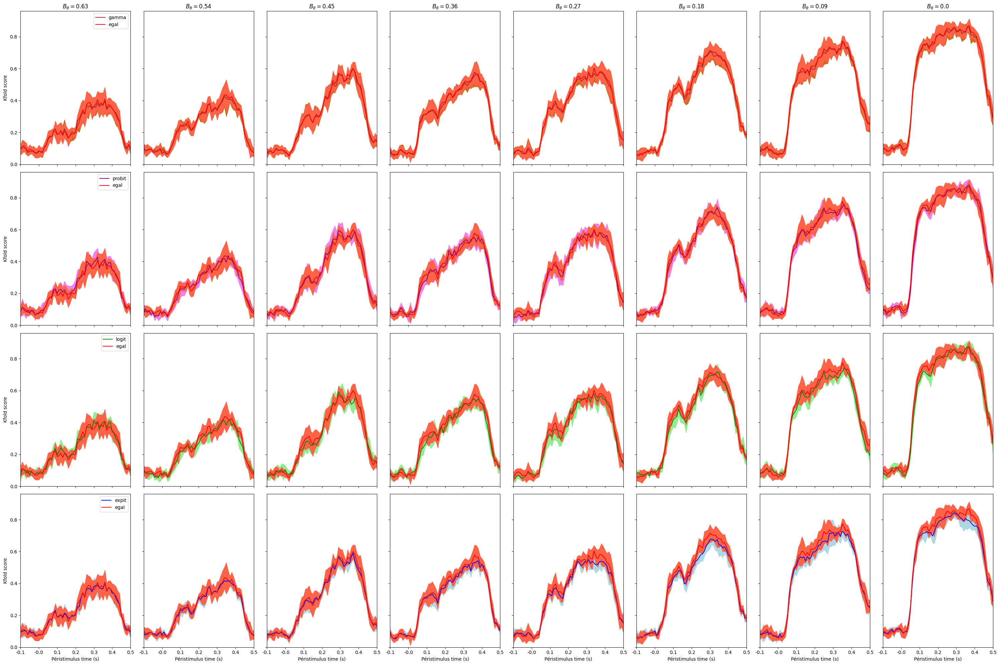

In [9]:
# Représentation graphique firing rate vs egalisation
fig, ax = plt.subplots(len(DATA_type)-2, 8, figsize=(30,20), sharex=True, sharey=True)
#fig.set_dpi(1000)
for i in range(2, len(DATA_type)):
    for j in range(len(prm.B_thetas)):
        ax[0,j].set_title(r"$B_{\theta} = $"+str(round(prm.B_thetas[j],2)))
        ax[i-2,j].fill_between(prm.timesteps, Mean[:,j,i]-Sd[:,j,i], Mean[:,j,i]+Sd[:,j,i], color=colors_fill[i])
        ax[i-2,j].plot(prm.timesteps, Mean[:,j,i], color=colors[i], label=DATA_type[i])
        ax[i-2,j].fill_between(prm.timesteps, Mean[:,j,1]-Sd[:,j,1], Mean[:,j,1]+Sd[:,j,1], color=colors_fill[1])
        ax[i-2,j].plot(prm.timesteps, Mean[:,j,1], color=colors[1], label=DATA_type[1])
        ax[i-2,j].set_xticks(prm.timesteps[::10],
                        [round(x,1) for x in np.linspace(-0.1, 0.5, len(prm.timesteps[::10]))])
        ax[-1,j].set_xlabel("Péristimulus time (s)")
    ax[i-2,0].set_ylabel("Kfold score")
    ax[i-2,0].legend()
ax[0,0].set_ylim(0)
ax[0,0].set_xlim(prm.timesteps[0], prm.timesteps[-1])
plt.tight_layout()
plt.savefig(os.path.join(path, "figs", "Transfo", "Decoding_theta_2"))
plt.show()

## Décodage de la variabilité ($B_{\theta}$)

In [10]:
# Chargement des données pour le décodage de l'identité du stimulus
data = np.load(os.path.join(path, "data", "Stage", "decod_btheta", "raw_data", "Data.npy"))
label = np.load(os.path.join(path, "data", "Stage", "decod_btheta", "raw_data", "Labels.npy"))
data_eq = np.load(os.path.join(path, "data", "Stage", "decod_btheta", "raw_data", "Data_eq.npy"))

# Vérification de l'importation
print(f"Data information : shape = {np.shape(data)}, mean = {np.mean(data)}, sd = {np.std(data)}")
print(f"Data_eq information : shape = {np.shape(data_eq)}, mean = {np.mean(data_eq)}, sd = {np.std(data_eq)}")

Data information : shape = (61, 2880, 249), mean = 0.8718462648407839, sd = 2.0511781482099045
Data_eq information : shape = (61, 2880, 249), mean = 0.8417163927455045, sd = 0.051205281309470545


In [11]:
# Autres transformations
data_gamma = ss.gamma(data_eq) 
data_probit = ss.erfinv(2*data_eq-1)
data_logit = ss.logit(data_eq)
data_expit = ss.expit(data_eq)

# Vérification des transformations
print(f"Data_gamma information : shape = {np.shape(data_gamma)}, mean = {np.mean(data_gamma)}, sd = {np.std(data_gamma)}")
print(f"Data_probit information : shape = {np.shape(data_probit)}, mean = {np.mean(data_probit)}, sd = {np.std(data_probit)}")
print(f"Data_logit information : shape = {np.shape(data_logit)}, mean = {np.mean(data_logit)}, sd = {np.std(data_logit)}")
print(f"Data_expit information : shape = {np.shape(data_expit)}, mean = {np.mean(data_expit)}, sd = {np.std(data_expit)}")

Data_gamma information : shape = (61, 2880, 249), mean = 1.1244216536098304, sd = 0.045136647828364705
Data_probit information : shape = (61, 2880, 249), mean = 0.7364273389642539, sd = 0.2057271040483971
Data_logit information : shape = (61, 2880, 249), mean = 1.7657504901379841, sd = 0.5790133586594219
Data_expit information : shape = (61, 2880, 249), mean = 0.6987153004958087, sd = 0.010623598924875969


In [12]:
# Fonction réalisant le décoding en utilisant un modèle de régression logistique
def decodeur(DATA=[], LABELS=[]):
    scores = np.zeros((len(prm.timesteps),prm.n_splits))
    logreg = LogisticRegression(**prm.opts_LR)
    for i in tqdm(range(DATA.shape[0]), desc = 'Decoding'):
        scores[i,:] = cross_val_score(logreg, DATA[i,:,:], LABELS, cv = prm.n_splits,
                                      n_jobs=-1, scoring = 'balanced_accuracy')
    Scores_mean = scores.mean(axis=-1)
    Scores_sd = scores.std(axis=-1)
    return Scores_mean, Scores_sd

In [13]:
Mean = np.zeros((len(prm.timesteps), len(DATA_type)))
Sd = np.zeros((len(prm.timesteps), len(DATA_type)))
for i, x in enumerate([data, data_eq, data_gamma, data_probit, data_logit, data_expit]):
    print(f"Data type : {DATA_type[i]}")
    Score_mean, Score_sd = decodeur(DATA=x, LABELS=label)
    Mean[:,i] = Score_mean
    Sd[:,i] = Score_sd

Data type : raw


Decoding:   0%|          | 0/61 [00:00<?, ?it/s]

Decoding: 100%|██████████| 61/61 [01:30<00:00,  1.48s/it]


Data type : egal


Decoding: 100%|██████████| 61/61 [01:06<00:00,  1.09s/it]


Data type : gamma


Decoding: 100%|██████████| 61/61 [01:03<00:00,  1.04s/it]


Data type : probit


Decoding: 100%|██████████| 61/61 [01:54<00:00,  1.88s/it]


Data type : logit


Decoding: 100%|██████████| 61/61 [03:53<00:00,  3.83s/it]


Data type : expit


Decoding: 100%|██████████| 61/61 [00:17<00:00,  3.51it/s]


In [14]:
# Sauvegarde des données du décoding
np.save(os.path.join(path, "data", "Transfo", "decod_btheta", "Score_mean.npy"), Mean)
np.save(os.path.join(path, "data", "Transfo", "decod_btheta", "Score_sd.npy"), Sd)

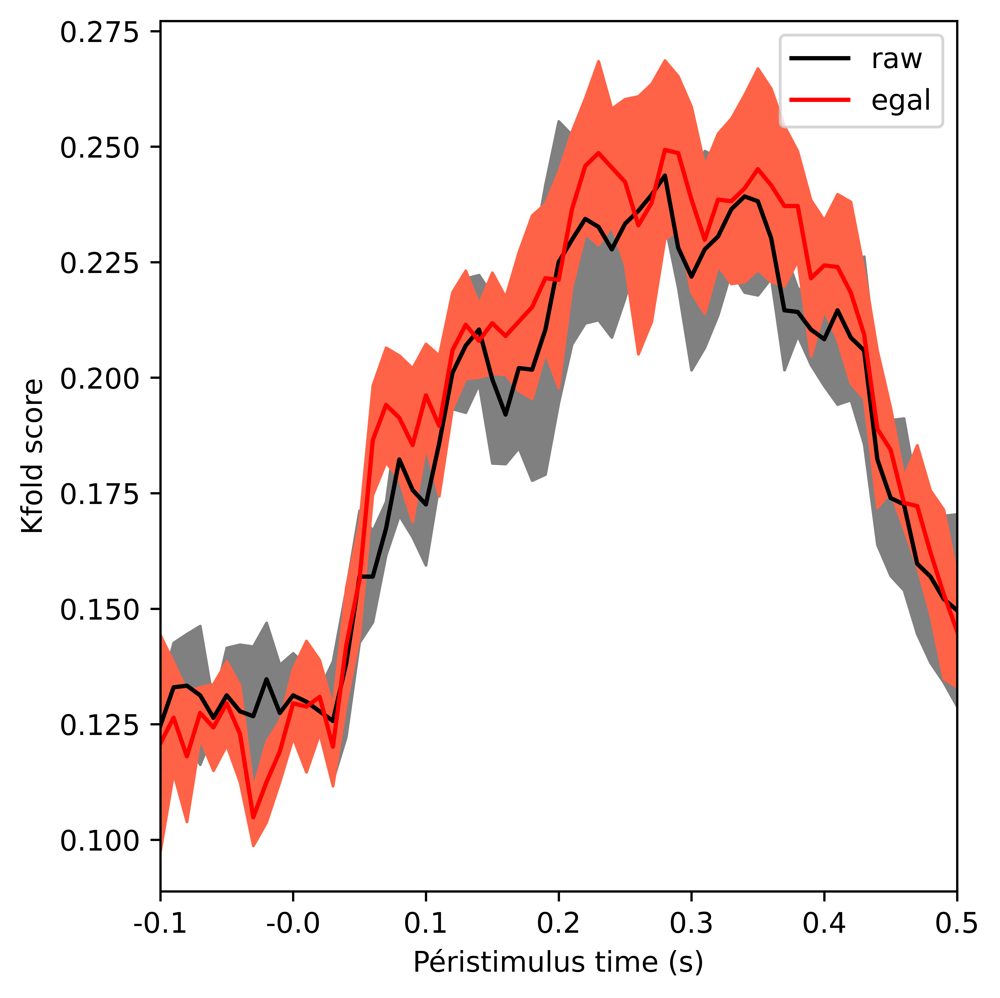

In [15]:
# Représentation graphique firing rate vs egalisation
fig, ax = plt.subplots(figsize=(5,5))
fig.set_dpi(1000)
for i in range(len(DATA_type[:2])):
    ax.fill_between(prm.timesteps,
                    Mean[:,i]-Sd[:,i],
                    Mean[:,i]+Sd[:,i],
                    color=colors_fill[i])
    ax.plot(prm.timesteps, Mean[:,i], label=DATA_type[i], color=colors[i])
    ax.set_xticks(prm.timesteps[::10],
                  [round(x,1) for x in np.linspace(-0.1, 0.5, len(prm.timesteps[::10]))])
    ax.set_xlabel("Péristimulus time (s)")
ax.set_xlim(prm.timesteps[0], prm.timesteps[-1])
ax.set_ylabel("Kfold score")
ax.legend()
plt.tight_layout()
plt.savefig(os.path.join(path, "figs", "Transfo", "Decoding_btheta_1"))
plt.show()

In [16]:
# Représentation graphique egalisation vs les autres
fig, ax = plt.subplots(1, len(DATA_type)-2, figsize=(20,5), sharex=True, sharey=True)
fig.set_dpi(1000)
for i in range(2, len(DATA_type)):
    ax[i-2].fill_between(prm.timesteps,
                    Mean[:,i]-Sd[:,i],
                    Mean[:,i]+Sd[:,i],
                    color=colors_fill[i])
    ax[i-2].plot(prm.timesteps, Mean[:,i], label=DATA_type[i], color=colors[i])
    ax[i-2].fill_between(prm.timesteps,
                    Mean[:,1]-Sd[:,1],
                    Mean[:,1]+Sd[:,1],
                    color=colors_fill[1])
    ax[i-2].plot(prm.timesteps, Mean[:,1], label=DATA_type[1], color=colors[1])
    ax[i-2].set_xticks(prm.timesteps[::10],
                       [round(x,1) for x in np.linspace(-0.1, 0.5, len(prm.timesteps[::10]))])
    ax[i-2].set_xlabel("Péristimulus time (s)")
    ax[i-2].legend()
ax[0].set_xlim(prm.timesteps[0], prm.timesteps[-1])
ax[0].set_ylabel("Kfold score")
plt.tight_layout()
plt.savefig(os.path.join(path, "figs", "Transfo", "Decoding_btheta_2"))
plt.show()

## Décodage de l'identité du stimulus ($\theta \times B_{\theta}$)

In [17]:
# Chargement des données pour le décodage de l'identité du stimulus
data = np.load(os.path.join(path, "data", "Stage", "decod_combinaison", "raw_data", "Data.npy"))
label = np.load(os.path.join(path, "data", "Stage", "decod_combinaison", "raw_data", "Labels.npy"))
data_eq = np.load(os.path.join(path, "data", "Stage", "decod_combinaison", "raw_data", "Data_eq.npy"))

# Vérification de l'importation
print(f"Data information : shape = {np.shape(data)}, mean = {np.mean(data)}, sd = {np.std(data)}")
print(f"Data_eq information : shape = {np.shape(data_eq)}, mean = {np.mean(data_eq)}, sd = {np.std(data_eq)}")

Data information : shape = (61, 2880, 249), mean = 0.8718462648407839, sd = 2.0511781482099045
Data_eq information : shape = (61, 2880, 249), mean = 0.8417163927455045, sd = 0.051205281309470545


In [18]:
# Autres transformations
data_gamma = ss.gamma(data_eq) 
data_probit = ss.erfinv(2*data_eq-1)
data_logit = ss.logit(data_eq)
data_expit = ss.expit(data_eq)

# Vérification des transformations
print(f"Data_gamma information : shape = {np.shape(data_gamma)}, mean = {np.mean(data_gamma)}, sd = {np.std(data_gamma)}")
print(f"Data_probit information : shape = {np.shape(data_probit)}, mean = {np.mean(data_probit)}, sd = {np.std(data_probit)}")
print(f"Data_logit information : shape = {np.shape(data_logit)}, mean = {np.mean(data_logit)}, sd = {np.std(data_logit)}")
print(f"Data_expit information : shape = {np.shape(data_expit)}, mean = {np.mean(data_expit)}, sd = {np.std(data_expit)}")

Data_gamma information : shape = (61, 2880, 249), mean = 1.1244216536098304, sd = 0.045136647828364705
Data_probit information : shape = (61, 2880, 249), mean = 0.7364273389642539, sd = 0.2057271040483971
Data_logit information : shape = (61, 2880, 249), mean = 1.7657504901379841, sd = 0.5790133586594219
Data_expit information : shape = (61, 2880, 249), mean = 0.6987153004958087, sd = 0.010623598924875969


In [19]:
Mean = np.zeros((len(prm.timesteps), len(DATA_type)))
Sd = np.zeros((len(prm.timesteps), len(DATA_type)))
for i, x in enumerate([data, data_eq, data_gamma, data_probit, data_logit, data_expit]):
    print(f"Data type : {DATA_type[i]}")
    Score_mean, Score_sd = decodeur(DATA=x, LABELS=label)
    Mean[:,i] = Score_mean
    Sd[:,i] = Score_sd

Data type : raw


Decoding: 100%|██████████| 61/61 [11:16<00:00, 11.09s/it]


Data type : egal


Decoding: 100%|██████████| 61/61 [02:27<00:00,  2.42s/it]


Data type : gamma


Decoding: 100%|██████████| 61/61 [02:17<00:00,  2.25s/it]


Data type : probit


Decoding: 100%|██████████| 61/61 [06:35<00:00,  6.49s/it]


Data type : logit


Decoding: 100%|██████████| 61/61 [15:38<00:00, 15.38s/it]


Data type : expit


Decoding: 100%|██████████| 61/61 [00:36<00:00,  1.67it/s]


In [20]:
# Sauvegarde des données du décoding
np.save(os.path.join(path, "data", "Transfo", "decod_combinaison", "Score_mean.npy"), Mean)
np.save(os.path.join(path, "data", "Transfo", "decod_combinaison", "Score_sd.npy"), Sd)

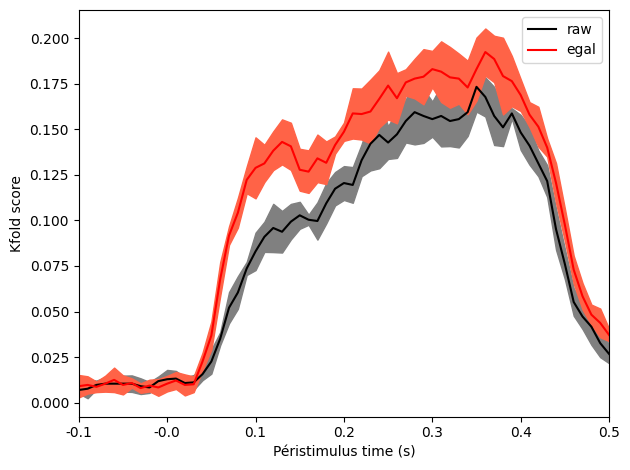

In [21]:
# Représentation graphique firing rate vs egalisation
fig, ax = plt.subplots()
for i in range(len(DATA_type[:2])):
    ax.fill_between(prm.timesteps,
                    Mean[:,i]-Sd[:,i],
                    Mean[:,i]+Sd[:,i],
                    color=colors_fill[i])
    ax.plot(prm.timesteps, Mean[:,i], label=DATA_type[i], color=colors[i])
    ax.set_xticks(prm.timesteps[::10],
                  [round(x,1) for x in np.linspace(-0.1, 0.5, len(prm.timesteps[::10]))])
    ax.set_xlabel("Péristimulus time (s)")
ax.set_xlim(prm.timesteps[0], prm.timesteps[-1])
ax.set_ylabel("Kfold score")
ax.legend()
plt.tight_layout()
plt.savefig(os.path.join(path, "figs", "Transfo", "Decoding_combinaison_1"))
plt.show()

In [22]:
# Représentation graphique egalisation vs les autres
fig, ax = plt.subplots(1, len(DATA_type)-2, figsize=(20,5), sharex=True, sharey=True)
fig.set_dpi(1000)
for i in range(2, len(DATA_type)):
    ax[i-2].fill_between(prm.timesteps,
                    Mean[:,i]-Sd[:,i],
                    Mean[:,i]+Sd[:,i],
                    color=colors_fill[i])
    ax[i-2].plot(prm.timesteps, Mean[:,i], label=DATA_type[i], color=colors[i])
    ax[i-2].fill_between(prm.timesteps,
                    Mean[:,1]-Sd[:,1],
                    Mean[:,1]+Sd[:,1],
                    color=colors_fill[1])
    ax[i-2].plot(prm.timesteps, Mean[:,1], label=DATA_type[1], color=colors[1])
    ax[i-2].set_xticks(prm.timesteps[::10],
                       [round(x,1) for x in np.linspace(-0.1, 0.5, len(prm.timesteps[::10]))])
    ax[i-2].set_xlabel("Péristimulus time (s)")
    ax[i-2].legend()
ax[0].set_xlim(prm.timesteps[0], prm.timesteps[-1])
ax[0].set_ylabel("Kfold score")
plt.tight_layout()
plt.savefig(os.path.join(path, "figs", "Transfo", "Decoding_combinaison_2"))
plt.show()